# First simple web-map with Folium


**Date**: 22.03.2023

**Course**: Methods of Spatial Analysis. Advanced Level. // HSE, Moscow, spring 2023


## 1. Import libraries


In [1]:
## For working with dataframes

import pandas as pd
import geopandas as gpd
import folium

from shapely import geometry


## 2.Read data from a geojson file


In [2]:
data = gpd.read_file('okn_pts.geojson')
data_poly = gpd.read_file('okn_ply.geojson')
data_poly.head()

Cannot find header.dxf (GDAL_DATA is not defined)


,fid,BUILDING,ADDR_CITY,A_STRT,A_SBRB,A_HSNMBR,A_PLACE,A_PSTCD,B_LEVELS,NAME,NAME_EN,NAME_RU,OSM_TYPE,OSM_ID,Объект,geometry
0,69,yes,Владивосток,Светланская улица,NaN,1,NaN,NaN,3,Тихий океан,NaN,NaN,relation,6938164,"Здание театра и гостиницы """"""""Тихий океан"""""""" ...","MULTIPOLYGON (((734265.623 4777835.572, 734270..."
1,143,school,Владивосток,Пушкинская улица,NaN,39,NaN,690001,4,NaN,NaN,NaN,relation,7612237,Здание Министерской женской гимназии (ныне - с...,"MULTIPOLYGON (((736193.962 4777889.220, 736222..."
2,204,yes,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,relation,8244818,Памятник адмиралу С.О.Макарову,"MULTIPOLYGON (((734053.002 4777622.217, 734083..."
3,206,yes,Владивосток,Набережная улица,NaN,20,NaN,NaN,NaN,NaN,NaN,NaN,relation,8244820,Памятник адмиралу С.О.Макарову,"MULTIPOLYGON (((734095.805 4777646.271, 734100..."
4,218,yes,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,relation,8315085,Жилой дом – памятник деревянного зодчества,"MULTIPOLYGON (((734473.805 4778276.691, 734471..."


In [3]:
data_poly

,fid,BUILDING,ADDR_CITY,A_STRT,A_SBRB,A_HSNMBR,A_PLACE,A_PSTCD,B_LEVELS,NAME,NAME_EN,NAME_RU,OSM_TYPE,OSM_ID,Объект,geometry
0,69,yes,Владивосток,Светланская улица,NaN,1,NaN,NaN,3,Тихий океан,NaN,NaN,relation,6938164,"Здание театра и гостиницы """"""""Тихий океан"""""""" ...","MULTIPOLYGON (((734265.623 4777835.572, 734270..."
1,143,school,Владивосток,Пушкинская улица,NaN,39,NaN,690001,4,NaN,NaN,NaN,relation,7612237,Здание Министерской женской гимназии (ныне - с...,"MULTIPOLYGON (((736193.962 4777889.220, 736222..."
2,204,yes,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,relation,8244818,Памятник адмиралу С.О.Макарову,"MULTIPOLYGON (((734053.002 4777622.217, 734083..."
3,206,yes,Владивосток,Набережная улица,NaN,20,NaN,NaN,NaN,NaN,NaN,NaN,relation,8244820,Памятник адмиралу С.О.Макарову,"MULTIPOLYGON (((734095.805 4777646.271, 734100..."
4,218,yes,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,relation,8315085,Жилой дом – памятник деревянного зодчества,"MULTIPOLYGON (((734473.805 4778276.691, 734471..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,41195,yes,NaN,улица Адмирала Фокина,NaN,4А,NaN,NaN,2,NaN,NaN,NaN,way,471302936,Дом доходный П.П.Поповой,"MULTIPOLYGON (((734358.931 4777908.275, 734362..."
176,41199,detached,NaN,улица Капитана Шефнера,NaN,19/2,NaN,NaN,NaN,NaN,NaN,NaN,way,471302940,Жилой дом,"MULTIPOLYGON (((737388.932 4777700.872, 737396..."
177,41202,apartments,NaN,Пушкинская улица,NaN,7,NaN,NaN,2,NaN,NaN,NaN,way,471302943,Дом известного общественного деятеля Владивост...,"MULTIPOLYGON (((735585.155 4777614.213, 735583..."
178,41486,yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,way,481489100,Доходный дом Тау-цзе-Линь,"MULTIPOLYGON (((734670.625 4777784.049, 734664..."


In [4]:

boundary = gpd.read_file('boundary.geojson')


In [5]:
rayoni = gpd.read_file("rayoni52.geojson")

In [6]:
rayoni.head()

,admin_leve,boundary,name,population,type,wikidata,wikipedia,geometry
0,9,administrative,Первореченский район,146482,boundary,Q16685617,ru:Первореченский район (Владивосток),"MULTIPOLYGON (((740470.232 4778999.394, 740460..."
1,NaN,administrative,Советский район,92493,boundary,Q16699112,ru:Советский район (Владивосток),"MULTIPOLYGON (((760986.695 4795412.016, 761199..."
2,NaN,administrative,Ленинский район,152458,boundary,Q16670751,ru:Ленинский район (Владивосток),"MULTIPOLYGON (((741372.843 4779191.334, 741389..."
3,NaN,administrative,Фрунзенский район,59976,boundary,Q4493123,ru:Фрунзенский район (Владивосток),"MULTIPOLYGON (((732512.698 4761868.649, 732511..."
4,NaN,administrative,Первомайский район,153193,boundary,Q4349419,ru:Первомайский район (Владивосток),"MULTIPOLYGON (((721426.947 4755315.503, 721363..."


In [7]:
data.columns

Index(['fid', 'field_1', 'V1', 'Объект', 'Номер в реестре', 'название улицы',
       'Комментарий', 'Идентификатор дома в ФИАС', 'FiasAuxSubobjId',
       'FiasAuxObjId', 'Идентификатор улицы в ФИАС',
       'Идентификатор населенного пункта в ФИАС',
       'Идентификатор внутрегородской территории в ФИАС',
       'Идентификатор города в ФИАС',
       'Идентификатор городских и сельских поселений в ФИАС',
       'Идентификатор района в ФИАС',
       'Идентификатор автономного округа в ФИАС',
       'Идентификатор региона в ФИАС', 'Идентификатор страны в ФИАС',
       'Полный адрес', 'На карте', 'Id-Регион', 'Регион', 'учетный номер',
       'Id-Категория историко-культурного значения',
       'Категория историко-культурного значения',
       'Id-Тип объекта культурного наследия',
       'Тип объекта культурного наследия', 'Id-Вид объекта', 'Вид объекта',
       'описание предмета охраны', 'текстовое описание границ',
       'Id-общая видовая принадлежность', 'Id-Принадлежность к Юнеско

In [8]:
data = data[['V1', 'Объект', 'Номер в реестре', 
       'Полный адрес',  'учетный номер',
       'Id-Категория историко-культурного значения',
       'Категория историко-культурного значения',
        'Вид объекта',
     
       'Принадлежность к Юнеско', 
       'Особо ценный объект', 'идентификатор ансамбля', 
        
       'Id - идентификатор', 
'geometry']]

In [9]:
data

,V1,Объект,Номер в реестре,Полный адрес,учетный номер,Id-Категория историко-культурного значения,Категория историко-культурного значения,Вид объекта,Принадлежность к Юнеско,Особо ценный объект,идентификатор ансамбля,Id - идентификатор,geometry
0,1,Батарея Новосильцевская,251520309630006,"Приморский край, г. Владивосток, о. Русский, п...",25-252,1,Федерального значения,Ансамбль,нет,нет,NA,148028,MULTIPOINT ((735522.328 4771791.500))
1,22,Могила Арсеньева Владимира Клавдиевича (1872-1...,251410091010006,"Приморский край, г. Владивосток, ул. Патрокл (...",25-24292,1,Федерального значения,Памятник,нет,нет,NA,166364,MULTIPOINT ((738976.985 4775342.889))
2,23,Жилой дом,251410091650005,"Приморский край, город Владивосток, улица Пушк...",25-26290,2,Регионального значения,Памятник,нет,нет,NA,166366,MULTIPOINT ((736183.491 4777795.565))
3,30,"Три братские могилы красноармейцев, павших в б...",251510207130006,"Приморский край, г. Владивосток, ул. Патрокл, ...",25-24270,1,Федерального значения,Памятник,нет,нет,NA,166441,MULTIPOINT ((738976.985 4775342.889))
4,32,"Три братские могилы красноармейцев, павших в б...",251410200980006,"Приморский край, г. Владивосток, Мемориальный ...",25-24274,1,Федерального значения,Памятник,нет,нет,NA,166457,MULTIPOINT ((738976.985 4775342.889))
...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,327,Батарея Ларионовская южная,251510114500116,"Приморский край, г. Владивосток, Фрунзенский р...",25-69661,1,Федерального значения,Памятник,нет,нет,169364,212085,MULTIPOINT ((734813.920 4779060.077))
79,328,Батарея Ларионовская на пике,251510114500896,"Приморский край, г. Владивосток, Фрунзенский р...",25-69503,1,Федерального значения,Памятник,нет,нет,169364,212088,MULTIPOINT ((730181.889 4772084.269))
80,329,Пороховой погреб П 4,251510114500746,"Приморский край, г. Владивосток, Фрунзенский р...",25-69489,1,Федерального значения,Памятник,нет,нет,169364,212089,MULTIPOINT ((733122.825 4775948.036))
81,330,Батарея «Басаргин»,251510114500166,"Приморский край, г. Владивосток, залив Уссурий...",25-69474,1,Федерального значения,Памятник,нет,нет,169364,212094,MULTIPOINT ((741277.801 4774244.937))


In [10]:
data.explore()

#### \* clear data and save only valuable attributes

(here is an example how to drop fields, you may need to delete more/less depends, you may choose another way to remove attributes )


## 2.Create Grid (fishnet)

- to plot concentration of cultural heritage (or any other point layer) with a choropleth map


#### 2.1. Check CRS of current data and decide do you need to reproject it or not?


- here is an example of reading the current crs and reprojecting geodataframe to another crs (you need to choose by yourself do you need it or not), but I'd rather reccommend to use UTM-zone, when you plot data with folium it is better to choose Web Mercator (EPSG:3857)


In [11]:
print(data.crs.name)

#if you need to reproject you can use .to_crs method
#data = data.to_crs("EPSG:4326")


WGS 84 / UTM zone 52N


#### 2.2. Get the extent of the data


In [12]:
total_bounds = data.total_bounds
minX, minY, maxX, maxY = total_bounds

In [13]:
total_bounds

array([ 727476.56014408, 4759123.33007076,  751248.18160502,
       4788700.80355618])

#### 2.3. Select cell-size


- what are the units?


In [14]:
square_size = 500

#### 2.4. Create fishnet


- you may choose another way to create using QGIS and read prepared data here


In [15]:
grid_cells = []
x, y = (minX, minY)
geom_array = []

while y <= maxY:
        while x <= maxX:
            geom = geometry.Polygon([(x,y), (x, y+square_size), (x+square_size, y+square_size), (x+square_size, y), (x, y)])
            geom_array.append(geom)
            x += square_size
        x = minX
        y += square_size


fishnet = gpd.GeoDataFrame(geom_array, columns=['geometry']).set_crs('EPSG:32652')
fishnet['id'] = fishnet.index

- save final grid to file if you need it


In [16]:
fishnet.explore()

In [17]:
fishnet.to_file('grid.gpkg')

## 3. Count Points in Polygon


#### 3.1. Merge fishnet and your points data to count them in polygons


In [18]:
merged = gpd.sjoin(data, fishnet, how='left', predicate='within')
merged['n'] = 1
dissolve = merged.dissolve(by="index_right", aggfunc="count")
fishnet.loc[dissolve.index, 'n'] = dissolve.n.values


#### 3.2. Plot the result


- we do it just to check the final result, no any other practical need


C:\Users\arina\anaconda3\envs\spatial_analysis_course\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


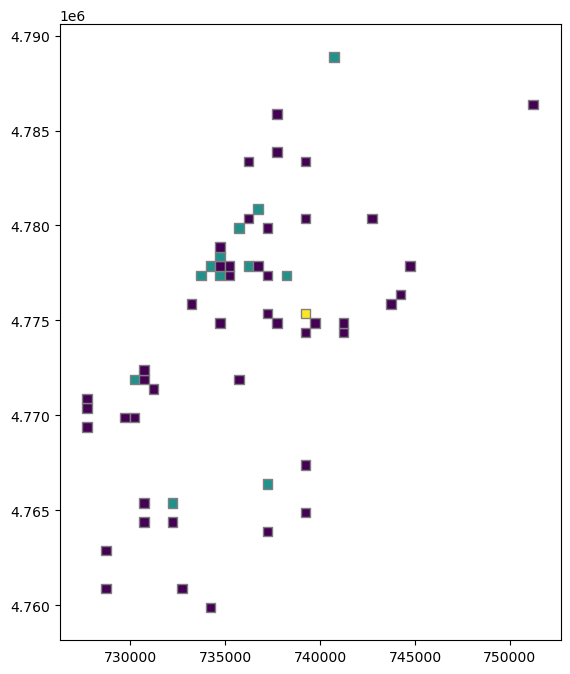

In [19]:
ax = fishnet.plot(column='n', figsize=(12, 8), cmap='viridis', scheme='natural_breaks', k=3, edgecolor="grey")


## 3. Create Web-map


#### 3.1 Map Settings

- carefully look at the function, try to understand what each variable stands for


In [20]:
data = data.to_crs('EPSG:4326')
m = folium.Map(location=[data.centroid.y.mean(), data.centroid.x.mean()], zoom_start=12,  tiles='CartoDB Positron', control_scale=True,)


C:\Users\arina\AppData\Local\Temp\ipykernel_37456\1800303131.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[data.centroid.y.mean(), data.centroid.x.mean()], zoom_start=12,  tiles='CartoDB Positron', control_scale=True,)


#### 3.2 Explore the map box. Do we need any changes?


In [21]:
boundary['City:']='Vladivostok'

In [22]:
boundary

,fid,full_id,osm_id,osm_type,boundary,addr:region,short_name:uk,short_name:ru,short_name:be,short_name,...,is_in:country,int_ref,int_name,gost_7.67-2003,alt_name:ko,admin_level,addr:country,ISO3166-2,geometry,City:
0,1,r1647394,1647394,relation,administrative,РџСЂРёРјРѕСЂСЃРєРёР№ РєСЂР°Р№,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,6,RU,NaN,"MULTIPOLYGON (((736448.179 4789102.432, 736501...",Vladivostok


#### 3.3 Create a Choropleth map based on a fishnet


In [23]:

folium.Choropleth(
  
       geo_data=boundary,
     tooltip=folium.GeoJsonTooltip(fields=['City:']),
    popup=folium.GeoJsonPopup(fields=['City:']),
      fill_color='B',
    fill_opacity = 0.001,
       line_color = "Grey",
    line_weight = 1.5,
    legend_name="Vladivostok boundary",
    name='Vladivostok boundary'
    
   
).add_to(m)

m

In [24]:
rayoni 

,admin_leve,boundary,name,population,type,wikidata,wikipedia,geometry
0,9,administrative,Первореченский район,146482,boundary,Q16685617,ru:Первореченский район (Владивосток),"MULTIPOLYGON (((740470.232 4778999.394, 740460..."
1,NaN,administrative,Советский район,92493,boundary,Q16699112,ru:Советский район (Владивосток),"MULTIPOLYGON (((760986.695 4795412.016, 761199..."
2,NaN,administrative,Ленинский район,152458,boundary,Q16670751,ru:Ленинский район (Владивосток),"MULTIPOLYGON (((741372.843 4779191.334, 741389..."
3,NaN,administrative,Фрунзенский район,59976,boundary,Q4493123,ru:Фрунзенский район (Владивосток),"MULTIPOLYGON (((732512.698 4761868.649, 732511..."
4,NaN,administrative,Первомайский район,153193,boundary,Q4349419,ru:Первомайский район (Владивосток),"MULTIPOLYGON (((721426.947 4755315.503, 721363..."


In [25]:
rayoni = rayoni[['name', 'population', 'geometry']]

In [26]:

folium.GeoJson(
    rayoni,
    tooltip=folium.GeoJsonTooltip(fields=['name', 'population']),
    popup=folium.GeoJsonPopup(fields=['name', 'population']),
     style_function=lambda x: {
        "fillColor": 'Nan',  
       'color': '#5f5f5f',
    'weight': 3,
    },
    
    zoom_on_click=True,
    show=False,
     name='name',

    
).add_to(m)

m

In [27]:
fishnet

,geometry,id,n
0,"POLYGON ((727476.560 4759123.330, 727476.560 4...",0,NaN
1,"POLYGON ((727976.560 4759123.330, 727976.560 4...",1,NaN
2,"POLYGON ((728476.560 4759123.330, 728476.560 4...",2,NaN
3,"POLYGON ((728976.560 4759123.330, 728976.560 4...",3,NaN
4,"POLYGON ((729476.560 4759123.330, 729476.560 4...",4,NaN
...,...,...,...
2875,"POLYGON ((748976.560 4788623.330, 748976.560 4...",2875,NaN
2876,"POLYGON ((749476.560 4788623.330, 749476.560 4...",2876,NaN
2877,"POLYGON ((749976.560 4788623.330, 749976.560 4...",2877,NaN
2878,"POLYGON ((750476.560 4788623.330, 750476.560 4...",2878,NaN


In [28]:
folium.Choropleth(
    geo_data=fishnet,
    data=fishnet,
    columns=['id', 'n'],
    fill_color='RdGy',
    fill_opacity = 0.5,
    key_on='id',
    nan_fill_opacity=0,
   line_color = "#0000",
   legend_name="amount of heritage sites",
   name='Heritage Sites Concentration'
).add_to(m)

- look a the map


In [29]:
m

#### 3.4 Add heritage buildings with tooltips


- try to color heritage buildings based on their conservation status


In [30]:
data_poly.head()

,fid,BUILDING,ADDR_CITY,A_STRT,A_SBRB,A_HSNMBR,A_PLACE,A_PSTCD,B_LEVELS,NAME,NAME_EN,NAME_RU,OSM_TYPE,OSM_ID,Объект,geometry
0,69,yes,Владивосток,Светланская улица,NaN,1,NaN,NaN,3,Тихий океан,NaN,NaN,relation,6938164,"Здание театра и гостиницы """"""""Тихий океан"""""""" ...","MULTIPOLYGON (((734265.623 4777835.572, 734270..."
1,143,school,Владивосток,Пушкинская улица,NaN,39,NaN,690001,4,NaN,NaN,NaN,relation,7612237,Здание Министерской женской гимназии (ныне - с...,"MULTIPOLYGON (((736193.962 4777889.220, 736222..."
2,204,yes,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,relation,8244818,Памятник адмиралу С.О.Макарову,"MULTIPOLYGON (((734053.002 4777622.217, 734083..."
3,206,yes,Владивосток,Набережная улица,NaN,20,NaN,NaN,NaN,NaN,NaN,NaN,relation,8244820,Памятник адмиралу С.О.Макарову,"MULTIPOLYGON (((734095.805 4777646.271, 734100..."
4,218,yes,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,relation,8315085,Жилой дом – памятник деревянного зодчества,"MULTIPOLYGON (((734473.805 4778276.691, 734471..."


In [31]:
#colors = ["orange", "yellow", "green", "blue"]
#categories = data_poly['Категория историко-культурного значения'].unique()

buid = folium.GeoJson(
    data_poly,
    name="Heritage buildings",
    tooltip=folium.GeoJsonTooltip(fields=['Объект']),
    popup=folium.GeoJsonPopup(fields=['Объект']),
    style_function=lambda x: {
        "fillColor": 'Black',  
       'color': '#5f5f5f',
    'weight': 1,
    },
    highlight_function=lambda x: {"fillOpacity": 0.8},
    zoom_on_click=True,
    show=False,
).add_to(m)


- look a the map


In [32]:
m

#### 3.5 Add points cluster


In [33]:
from folium.plugins import MarkerCluster

In [34]:
data

,V1,Объект,Номер в реестре,Полный адрес,учетный номер,Id-Категория историко-культурного значения,Категория историко-культурного значения,Вид объекта,Принадлежность к Юнеско,Особо ценный объект,идентификатор ансамбля,Id - идентификатор,geometry
0,1,Батарея Новосильцевская,251520309630006,"Приморский край, г. Владивосток, о. Русский, п...",25-252,1,Федерального значения,Ансамбль,нет,нет,NA,148028,MULTIPOINT ((131.89239 43.06228))
1,22,Могила Арсеньева Владимира Клавдиевича (1872-1...,251410091010006,"Приморский край, г. Владивосток, ул. Патрокл (...",25-24292,1,Федерального значения,Памятник,нет,нет,NA,166364,MULTIPOINT ((131.93628 43.09314))
2,23,Жилой дом,251410091650005,"Приморский край, город Владивосток, улица Пушк...",25-26290,2,Регионального значения,Памятник,нет,нет,NA,166366,MULTIPOINT ((131.90305 43.11607))
3,30,"Три братские могилы красноармейцев, павших в б...",251510207130006,"Приморский край, г. Владивосток, ул. Патрокл, ...",25-24270,1,Федерального значения,Памятник,нет,нет,NA,166441,MULTIPOINT ((131.93628 43.09314))
4,32,"Три братские могилы красноармейцев, павших в б...",251410200980006,"Приморский край, г. Владивосток, Мемориальный ...",25-24274,1,Федерального значения,Памятник,нет,нет,NA,166457,MULTIPOINT ((131.93628 43.09314))
...,...,...,...,...,...,...,...,...,...,...,...,...,...
78,327,Батарея Ларионовская южная,251510114500116,"Приморский край, г. Владивосток, Фрунзенский р...",25-69661,1,Федерального значения,Памятник,нет,нет,169364,212085,MULTIPOINT ((131.88677 43.12787))
79,328,Батарея Ларионовская на пике,251510114500896,"Приморский край, г. Владивосток, Фрунзенский р...",25-69503,1,Федерального значения,Памятник,нет,нет,169364,212088,MULTIPOINT ((131.82700 43.06655))
80,329,Пороховой погреб П 4,251510114500746,"Приморский край, г. Владивосток, Фрунзенский р...",25-69489,1,Федерального значения,Памятник,нет,нет,169364,212089,MULTIPOINT ((131.86470 43.10040))
81,330,Батарея «Басаргин»,251510114500166,"Приморский край, г. Владивосток, залив Уссурий...",25-69474,1,Федерального значения,Памятник,нет,нет,169364,212094,MULTIPOINT ((131.96404 43.08253))


In [35]:
marker_cluster = MarkerCluster(name='Heritage Sites')
mc1= folium.plugins.FeatureGroupSubGroup(marker_cluster, 'Heritage Sites', overlay=True,control=True,show=True)
m.add_child(marker_cluster)
m.add_child(mc1)
mc1.add_child(folium.GeoJson(data.to_json(), embed=False, show=False))


In [36]:
m

#### 3.6 Add different widgets to map


- import plugins


In [37]:
from folium.plugins import MousePosition
from folium.plugins import Fullscreen

In [38]:
from folium.plugins import MiniMap

In [39]:
folium.LayerControl().add_to(m)

In [40]:
MousePosition().add_to(m)
Fullscreen(
    position="bottomright",
    title="Expand me",
    title_cancel="Exit me",
    force_separate_button=True,
).add_to(m)
MiniMap(tile_layer='CartoDB Positron').add_to(m)


In [41]:
from folium import plugins

In [42]:
search = plugins.Search(layer=buid,
    geom_type="Polygon",
    placeholder="Search for a Heritage",
    collapsed=False,
    search_label="Объект",
    weight=3,).add_to(m)

In [43]:
m

## 4. Save map to index.html file and prepare to publish it


In [44]:
m.save("index.html")